Tiling demo

In [1]:
import numpy as np
import pandas as pd
import utm
import matplotlib.pyplot as plt
from nerd.mapping import *
from scipy.interpolate import griddata
from matplotlib import path
import time
%matplotlib inline

In [2]:
columns = ["TMDAT","Fecha", "Hora","Lat", "Lon", "W","X","Y","Z"]

In [3]:
data = pd.read_csv('data/280320-06-95mm.txt', names=columns)

In [4]:
data["Este"],data["Norte"] = utm.from_latlon(data.Lat.values, data.Lon.values)[0:2]

In [5]:
spatial_resolution = 2
width = 65
data_bucket = data.Y.to_numpy()
x_grid, y_grid, total_density = calculate_total_density(data.Este,data.Norte, data_bucket, width, spatial_resolution)


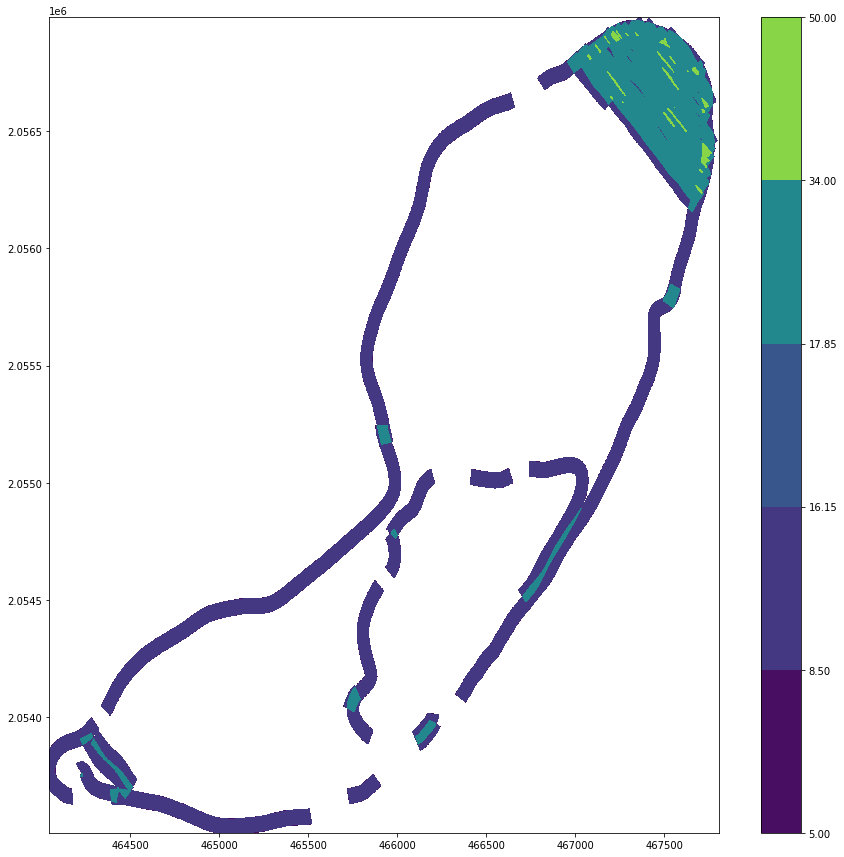

In [42]:
plt.figure(figsize=(15,15))
plt.contourf(x_grid, y_grid, total_density, levels)
plt.colorbar()

## to export to shp

In [18]:
total_density_ravel = pd.DataFrame(np.ravel(total_density))
total_density_ravel.describe()

,0
count,3.271059e+06
mean,1.241708e+00
std,4.504028e+00
min,0.000000e+00
25%,0.000000e+00
50%,0.000000e+00
75%,0.000000e+00
max,5.000000e+01


In [21]:
total_density = np.reshape(np.array(total_density_ravel), x_grid.shape)

In [40]:
def density_contours_intervals(x, total_density):
    mask_zeros = total_density != 0
    total_density_masked = total_density[mask_zeros]
    return np.unique([total_density_masked.min()/2 ,x/2, x*0.95, x*1.05, np.min([2*x, np.max(total_density)]), np.max([2*x, np.max(total_density)])])

levels = density_contours_intervals(17, total_density)
print(levels)

[ 5.    8.5  16.15 17.85 34.   50.  ]


In [32]:
mask_zeros = total_density == 0
total_density_masked = total_density[~mask_zeros]

9.999999999999998

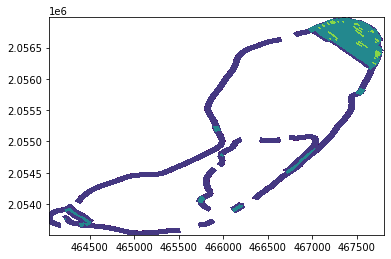

In [41]:
contours, contours_dict = generate_contours(x_grid, y_grid, total_density, levels)


In [43]:
polygon_list = create_contour_polygon_list(contours, contours_dict)

In [44]:
export_contour_list_as_shapefile(polygon_list, "example_nerd_output.shp")


## Density in tiles


In [9]:
density_grid_in_tiles = []
x=np.arange(min(data.Este), max(data.Este), spatial_resolution)
y=np.arange(min(data.Norte), max(data.Norte), spatial_resolution)
x_grid, y_grid = np.meshgrid(x,y)
x_grid_ravel = np.ravel(x_grid)
y_grid_ravel = np.ravel(y_grid)
total_density = np.zeros_like(x_grid_ravel)
points = np.array([x_grid_ravel, y_grid_ravel]).T
data_bucket = data.Y.to_numpy()
start = time.time()
for i in range(1,1000):
    if data_bucket[i] == 0: #cubeta
        continue
    else: 
        #print("Calculating density in tile {} of {}".format(i,len(data)-2))
        x_rect, y_rect = generate_cell_from_coordinates(data.Este,data.Norte,i,width,spatial_resolution)
        inside_mask = is_inside_tile(x_rect, y_rect, points)
        sub_grid_x = x_grid_ravel[inside_mask]
        sub_grid_y = y_grid_ravel[inside_mask]
        cell_density = density_in_tile(x_rect,y_rect, normal_density_array,n)(sub_grid_x, sub_grid_y)
        total_density[inside_mask] = total_density[inside_mask] + cell_density
end = time.time()
print("Elapsed (after compilation) = %s" % (end - start))

Elapsed (after compilation) = 45.31191658973694


## Full example

NameError: name 'calculate_total_density' is not defined

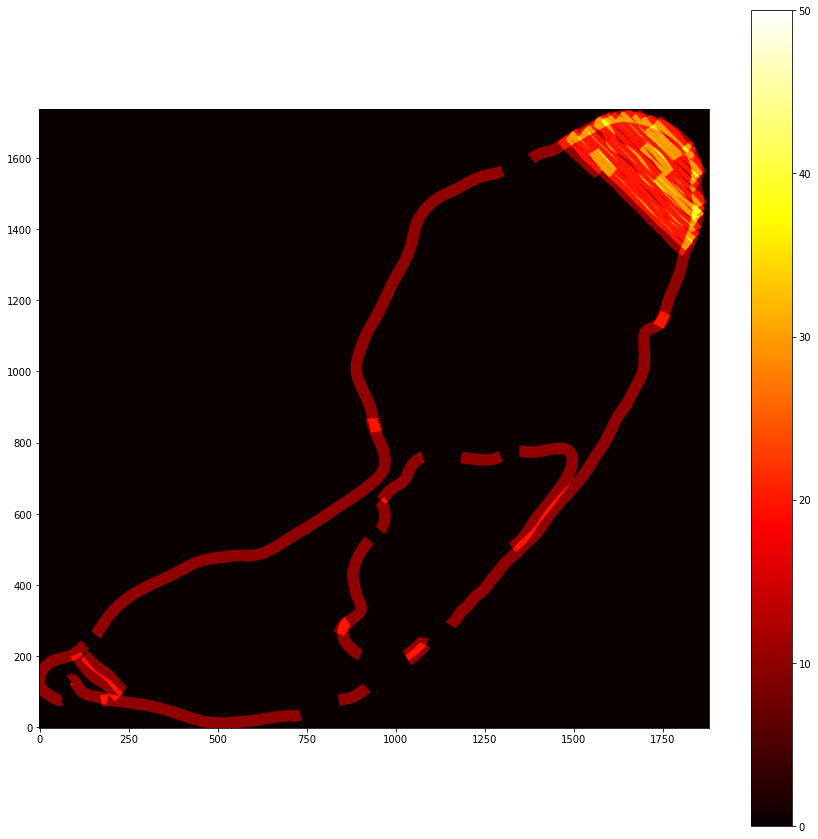

In [18]:
plt.figure(figsize=(15,15))
total_density_reshaped = np.reshape(total_density,x_grid.shape)
plt.imshow(total_density_reshaped, vmin=0, vmax=np.max(total_density), cmap="hot", origin='lower')
plt.colorbar()

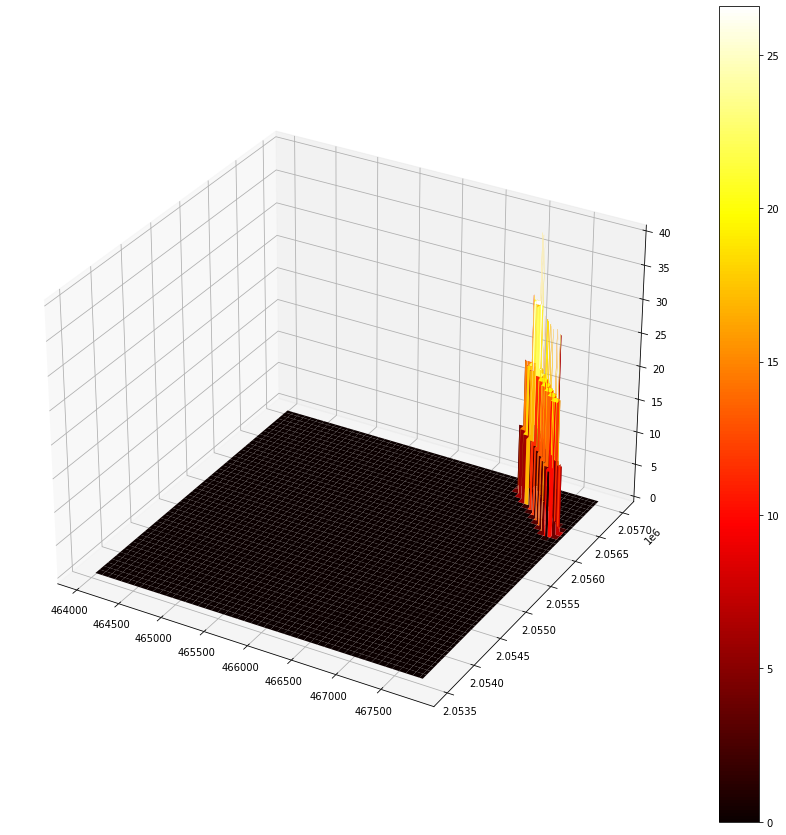

In [12]:

fig, ax = plt.subplots(subplot_kw={"projection": "3d"}, figsize=(15,15))
nerd = ax.plot_surface(x_grid, y_grid, total_density_reshaped, cmap='hot')
fig.colorbar(nerd)

# Abby Rocks example

In [12]:
import geopandas as gpd

In [13]:
abby_rocks_gdf = gpd.read_file("data/abby_rocks_data/abbey_rocks_example.shp")

DriverError: data/abbey_rocks_example.shp: No such file or directory

In [10]:
gpd.__version__

'0.9.0'

In [11]:
abby_rocks_gdf?

Type:        GeoDataFrame
String form:
geometry
           0      POINT (1304145.327 5147905.086)
           1      POINT (13041 <...>  POINT (1304133.801 5147898.159)
           11227  POINT (1304144.636 5147893.375)
           
           [11228 rows x 1 columns]
Length:      11228
File:        /usr/local/lib/python3.9/site-packages/geopandas/geodataframe.py
Docstring:  
A GeoDataFrame object is a pandas.DataFrame that has a column
with geometry. In addition to the standard DataFrame constructor arguments,
GeoDataFrame also accepts the following keyword arguments:

Parameters
----------
crs : value (optional)
    Coordinate Reference System of the geometry objects. Can be anything accepted by
    :meth:`pyproj.CRS.from_user_input() <pyproj.crs.CRS.from_user_input>`,
    such as an authority string (eg "EPSG:4326") or a WKT string.
geometry : str or array (optional)
    If str, column to use as geometry. If array, will be set as 'geometry'
    column on GeoDataFrame.

Examples
-------